# Prepare Ross Ice Shelf gravity data

import the necessary packages

In [1]:
%load_ext autoreload
%autoreload 2
%load_ext snakeviz
from antarctic_plots import fetch, regions, utils, maps
import pygmt
import numpy as np
import pandas as pd
import numpy as np
from scipy import stats
import geopandas as gpd
import xarray as xr
import rioxarray
import verde as vd
import harmonica as hm
from pyproj import Transformer
import os
import zarr
import math
import scipy
import warnings
from tqdm.auto import tqdm
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
import pickle

from RIS_gravity_inversion import gravity_processing as grav
from RIS_gravity_inversion import utils as inv_utils

os.getcwd()

'/Users/home/tankerma/RIS_gravity_inversion/notebooks/Ross_Ice_Shelf_inversion'

# ROSETTA-Ice data

## load raw data
with antarctic_plots.fetch

,line,LATITUDE,LONGITUDE,unixtime,Height,easting,northing,FAG_levelled
count,398279.000000,398279.000000,398279.000000,3.982790e+05,398279.000000,398279.000000,3.982790e+05,398279.000000
mean,661.219550,-80.571198,-36.741857,1.457515e+09,793.056619,-84278.810943,-1.000705e+06,-40.834964
std,264.422153,1.786949,165.241996,1.431469e+07,83.977581,212966.781186,1.984653e+05,14.254793
min,20.000000,-85.389220,-179.999880,1.447367e+09,650.023000,-571781.809097,-1.367767e+06,-326.330214
25%,470.000000,-81.869075,-169.885715,1.448316e+09,744.524000,-240585.860838,-1.160510e+06,-48.199458
50%,650.000000,-80.392556,-158.359371,1.449134e+09,774.652000,-78622.827092,-1.010417e+06,-40.625217
75%,840.000000,-79.145016,171.037900,1.479949e+09,819.844000,80843.853800,-8.504463e+05,-32.873787
max,1140.000000,-77.339971,180.000724,1.480734e+09,1377.258000,371757.426732,-4.604543e+05,35.356213


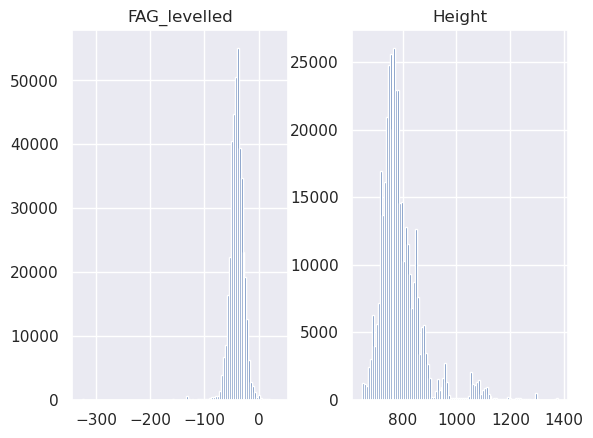

In [2]:
rosetta = fetch.ROSETTA_gravity()

# set standard column names
rosetta = rosetta.rename(columns={"Line": "line", "x": "easting", "y": "northing"})

# rosetta = gpd.GeoDataFrame(
#     rosetta,
#     geometry=gpd.points_from_xy(x=rosetta.easting, y=rosetta.northing),
# )
rosetta.dropna(subset="FAG_levelled", inplace=True)
rosetta[["FAG_levelled", "Height"]].hist(bins=100)
rosetta.describe()

## load cleaned and upward continued data from notebook `ROSETTA_levelling`

In [3]:
rosetta_UC = pd.read_csv(
    "../../data/ROSETTA_UC.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)
rosetta_UC.dropna(subset="FAG_levelled", inplace=True)
rosetta_UC.describe()

,easting,northing,line,LATITUDE,LONGITUDE,unixtime,Height,FAG_levelled,dist_along_line,mistie_before_UC,intersecting_line,up_cont_grav,dif,mistie_after_UC
count,37832.000000,3.783200e+04,37832.000000,36943.000000,36943.000000,3.694300e+04,37832.0,37832.000000,37832.000000,1736.000000,868.000000,37832.000000,37832.000000,868.000000
mean,-86958.953633,-1.000078e+06,666.267208,-80.578534,-38.057022,1.457176e+09,1000.0,-40.648447,329041.858816,0.666057,816.256912,-40.301792,0.346655,0.550084
std,211513.366937,1.972157e+05,266.662855,1.777064,164.889158,1.413857e+07,0.0,13.688910,219943.485574,5.459724,285.718138,13.366303,0.791764,5.112909
min,-571286.658609,-1.367282e+06,20.000000,-85.387441,-179.978599,1.447367e+09,1000.0,-326.330176,228.712147,-32.073100,50.000000,-313.361581,-10.598228,-23.417965
25%,-241606.136892,-1.160502e+06,470.000000,-81.872637,-169.941469,1.448317e+09,1000.0,-48.086096,142434.627394,-1.754538,570.000000,-47.647598,0.029115,-1.789559
50%,-80963.463140,-1.010419e+06,650.000000,-80.391666,-158.465670,1.449134e+09,1000.0,-40.612412,301679.715487,0.254597,955.000000,-40.289029,0.302248,0.041781
75%,73276.253330,-8.504441e+05,850.000000,-79.163388,171.032347,1.479947e+09,1000.0,-32.917612,491593.024831,1.945501,1070.000000,-32.732001,0.613522,1.899811
max,371296.853790,-4.604545e+05,1140.000000,-77.344218,179.979597,1.480734e+09,1000.0,36.478854,908258.425261,43.436215,1140.000000,25.880625,31.035595,38.791635


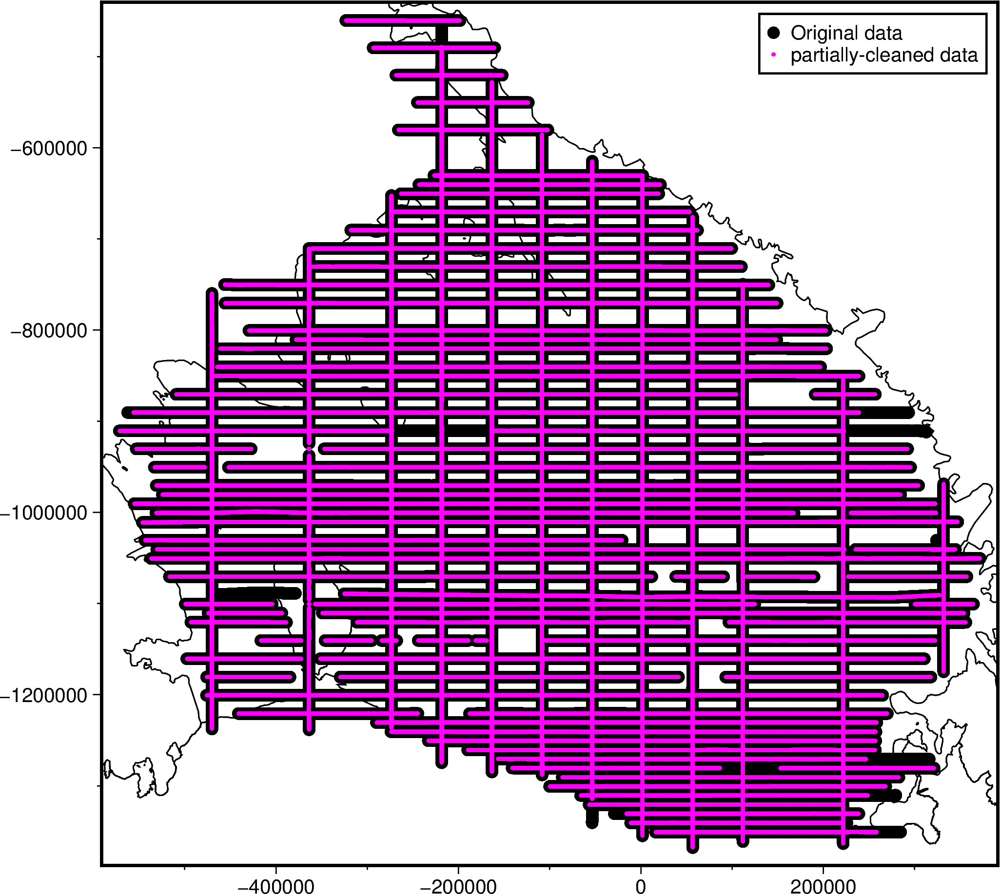

In [4]:
# plot a basemap
fig = maps.basemap(
    region=vd.pad_region(
        vd.get_region((rosetta_UC.easting, rosetta_UC.northing)), 20e3
    ),
    frame=True,
    coast=True,
    coast_version="measures-v2",
    # background="black",
)

# plot gravity data
fig.plot(
    x=rosetta.easting,
    y=rosetta.northing,
    style="c6p",
    fill="black",
    label="Original data",
)

# plot gravity data
fig.plot(
    x=rosetta_UC.easting,
    y=rosetta_UC.northing,
    style="c2p",
    fill="magenta",
    label="partially-cleaned data",
)
fig.legend()
fig.show()

In [5]:
rosetta_levelled = pd.read_csv(
    "../../data/ROSETTA_2nd_order_levelled.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)

# rename second to last column to "disturbance"
col = list(rosetta_levelled.columns)[-2]
rosetta_levelled.rename(columns={col: "disturbance"}, inplace=True)

# drop unnecessary columns
cols_to_keep = ["disturbance", "easting", "northing", "line", "Height"]
rosetta_levelled = rosetta_levelled.filter(cols_to_keep)

rosetta_levelled.dropna(subset="disturbance", inplace=True)
rosetta_levelled.describe()

,disturbance,easting,northing,line,Height
count,37818.000000,37818.000000,3.781800e+04,37818.000000,37818.0
mean,-40.573486,-86944.360281,-1.000040e+06,666.195224,1000.0
std,13.044203,211512.049830,1.972253e+05,266.652091,0.0
min,-309.999511,-571286.658609,-1.367282e+06,20.000000,1000.0
25%,-47.650790,-241595.908279,-1.160502e+06,470.000000,1000.0
50%,-40.573243,-80945.395470,-1.010418e+06,650.000000,1000.0
75%,-33.586492,73274.120527,-8.504439e+05,850.000000,1000.0
max,26.415489,371296.853790,-4.604545e+05,1140.000000,1000.0


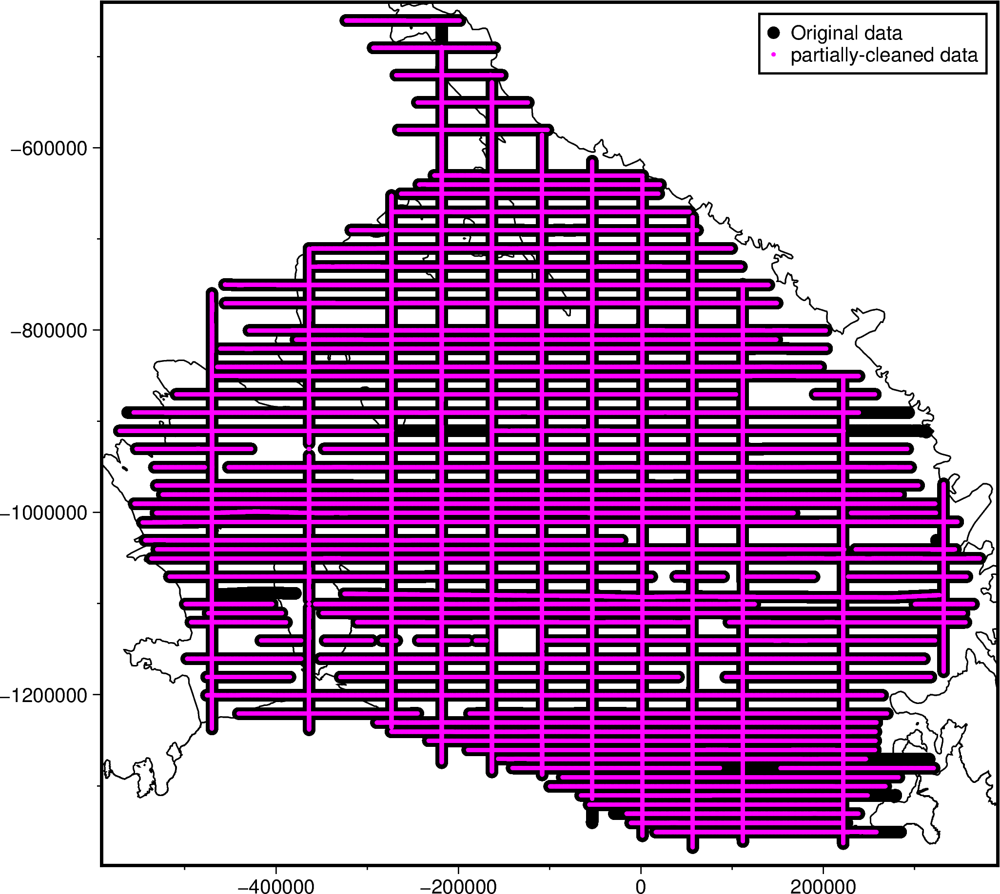

In [6]:
# plot a basemap
fig = maps.basemap(
    region=vd.pad_region(
        vd.get_region((rosetta_UC.easting, rosetta_UC.northing)), 20e3
    ),
    frame=True,
    coast=True,
    coast_version="measures-v2",
    # background="black",
)

# plot gravity data
fig.plot(
    x=rosetta.easting,
    y=rosetta.northing,
    style="c6p",
    fill="black",
    label="Original data",
)

# plot gravity data
fig.plot(
    x=rosetta_levelled.easting,
    y=rosetta_levelled.northing,
    style="c2p",
    fill="magenta",
    label="partially-cleaned data",
)
fig.legend()
fig.show()

## Grid with Equivalent Sources
at half the desired spacing to create the test and training sets

In [12]:
eqs = hm.EquivalentSources(damping=10e3, depth=10e3, block_size=2e3)

coords = (
    rosetta_UC.easting,
    rosetta_UC.northing,
    np.ones_like(rosetta_UC.northing) * 1e3,
)
data = rosetta_UC.up_cont_grav

eqs.fit(coords, data)

EquivalentSources(block_size=2000.0, damping=10000.0, depth=10000.0)

In [13]:
# Define grid coordinates
# region = vd.pad_region(vd.get_region(coords), 25e3)
region = regions.ross_ice_shelf
grid_coords = vd.grid_coordinates(
    region=region,
    spacing=5e3,
    pixel_register=False,
    extra_coords=1e3,  # upward continue to 1km
)

# grid the coordinates
observations = vd.make_xarray_grid(
    (grid_coords[0], grid_coords[1]),
    data=grid_coords[2],
    data_names="upward",
    dims=("northing", "easting"),
).upward


grav_df = vd.grid_to_table(observations)

# resample to half spacing to make training / testing points
grav_df = inv_utils.resample_with_test_points(5e3, grav_df, region)

grav_df["Gobs"] = eqs.predict((grav_df.easting, grav_df.northing, grav_df.upward))

grid = grav_df.set_index(["northing", "easting"]).to_xarray()

grav_df["masked"] = vd.distance_mask(
    (rosetta_UC.easting, rosetta_UC.northing),
    maxdist=25e3,
    coordinates=(grav_df.easting, grav_df.northing),
)

grav_df = grav_df[grav_df.masked].drop(columns="masked")
grav_df

,northing,easting,test,upward,Gobs
5823,-1390000.0,47500.0,True,1000.0,-28.936964
5824,-1390000.0,50000.0,False,1000.0,-28.720650
5825,-1390000.0,52500.0,True,1000.0,-28.482940
5826,-1390000.0,55000.0,False,1000.0,-28.222372
5827,-1390000.0,57500.0,True,1000.0,-27.938637
...,...,...,...,...,...
181365,-437500.0,-200000.0,True,1000.0,-59.409026
181366,-437500.0,-197500.0,True,1000.0,-58.672065
181367,-437500.0,-195000.0,True,1000.0,-57.989730
181368,-437500.0,-192500.0,True,1000.0,-57.364261


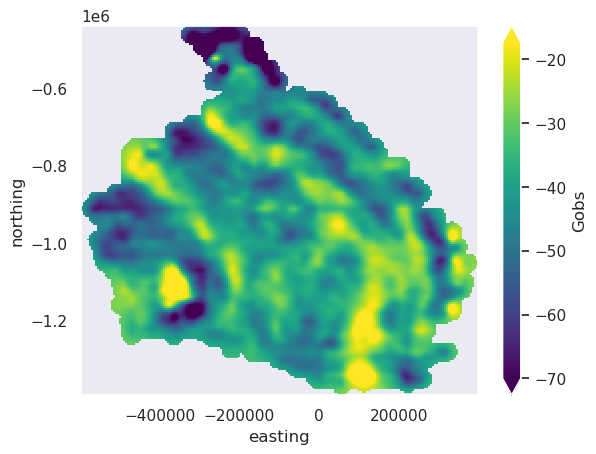

In [14]:
grav_grid = grav_df[~grav_df.test].set_index(["northing", "easting"]).to_xarray().Gobs
grav_grid.plot(robust=True)

In [15]:
eqs = hm.EquivalentSources(damping=5e2, depth=25e3, block_size=2e3)

coords = (
    rosetta_levelled.easting,
    rosetta_levelled.northing,
    rosetta_levelled.Height,
)
data = rosetta_levelled.disturbance

eqs.fit(coords, data)

EquivalentSources(block_size=2000.0, damping=500.0, depth=25000.0)

In [16]:
# Define grid coordinates
# region = vd.pad_region(vd.get_region(coords), 25e3)
region = regions.ross_ice_shelf
grid_coords = vd.grid_coordinates(
    region=region,
    spacing=5e3,
    pixel_register=False,
    extra_coords=1e3,  # upward continue to 1km
)

# grid the coordinates
observations = vd.make_xarray_grid(
    (grid_coords[0], grid_coords[1]),
    data=grid_coords[2],
    data_names="upward",
    dims=("northing", "easting"),
).upward


grav_df_levelled = vd.grid_to_table(observations)

# resample to half spacing to make training / testing points
grav_df_levelled = inv_utils.resample_with_test_points(5e3, grav_df_levelled, region)

grav_df_levelled["Gobs"] = eqs.predict(
    (grav_df_levelled.easting, grav_df_levelled.northing, grav_df_levelled.upward)
)

# fill all gaps within data
# mask on distance to nearest data point
# grav_df_levelled["masked"] = vd.distance_mask(
#     (rosetta_levelled.easting, rosetta_levelled.northing),
#     maxdist=50e3,
#     coordinates=(grav_df_levelled.easting, grav_df_levelled.northing),
# )
# grav_df_levelled = grav_df_levelled[grav_df_levelled.masked].drop(columns="masked")

# mask with convex hull
# grav_df_levelled["masked"] = vd.convexhull_mask(
#     # data_coordinates=(rosetta_levelled.easting, rosetta_levelled.northing),
#     data_coordinates=(grav_df_levelled.easting, grav_df_levelled.northing),
#     coordinates=(grav_df_levelled.easting, grav_df_levelled.northing),
#     # coordinates=(rosetta_levelled.easting, rosetta_levelled.northing),
# )
# grav_df_levelled = grav_df_levelled[grav_df_levelled.masked].drop(columns="masked")

grav_df_levelled

,northing,easting,test,upward,Gobs
0,-1420000.0,-680000.0,False,1000.0,-18.210886
1,-1420000.0,-677500.0,True,1000.0,-18.254817
2,-1420000.0,-675000.0,False,1000.0,-18.298859
3,-1420000.0,-672500.0,True,1000.0,-18.343010
4,-1420000.0,-670000.0,False,1000.0,-18.387269
...,...,...,...,...,...
205140,-310000.0,460000.0,False,1000.0,-17.614569
205141,-310000.0,462500.0,True,1000.0,-17.571305
205142,-310000.0,465000.0,False,1000.0,-17.528220
205143,-310000.0,467500.0,True,1000.0,-17.485311


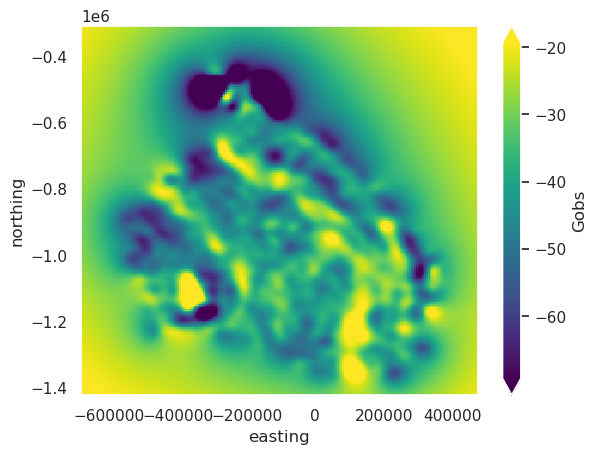

In [17]:
grav_grid_levelled = (
    grav_df_levelled[~grav_df_levelled.test]
    .set_index(["northing", "easting"])
    .to_xarray()
    .Gobs
)
grav_grid_levelled.plot(robust=True)

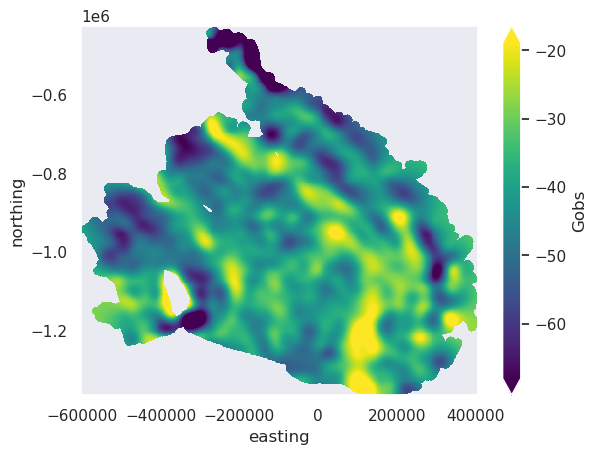

In [27]:
# subset gravity to just within ice shelf border
measures_shelves = fetch.measures_boundaries(version="IceShelf")
ice_shelves = gpd.read_file(measures_shelves)
RIS_seperate = ice_shelves[ice_shelves.NAME.isin(["Ross_West", "Ross_East"])]
RIS = RIS_seperate.dissolve().buffer(10e3)

grav_grid_levelled = grav_df_levelled.set_index(["northing", "easting"]).to_xarray()

# mask grav outside of RIS
grav_grid_levelled["inside"] = utils.mask_from_shp(
    shapefile=RIS,
    xr_grid=grav_grid_levelled.Gobs,
    masked=False,
    invert=False,
)
masked_df = vd.grid_to_table(grav_grid_levelled)
masked_df = masked_df[masked_df.inside]
masked_grid = masked_df.set_index(["northing", "easting"]).to_xarray()
masked_grid.Gobs.plot(robust=True)

In [28]:
masked_df

,northing,easting,test,upward,Gobs,inside
1952,-1365000.0,147500.0,True,1000.0,-21.437198,True
1953,-1365000.0,150000.0,False,1000.0,-22.503368,True
1954,-1365000.0,152500.0,True,1000.0,-23.521033,True
1955,-1365000.0,155000.0,False,1000.0,-24.474428,True
1956,-1365000.0,157500.0,True,1000.0,-25.353009,True
...,...,...,...,...,...,...
156288,-427500.0,-262500.0,True,1000.0,-52.962891,True
156289,-427500.0,-260000.0,True,1000.0,-54.814527,True
156290,-427500.0,-257500.0,True,1000.0,-56.674146,True
156699,-425000.0,-265000.0,False,1000.0,-50.846823,True


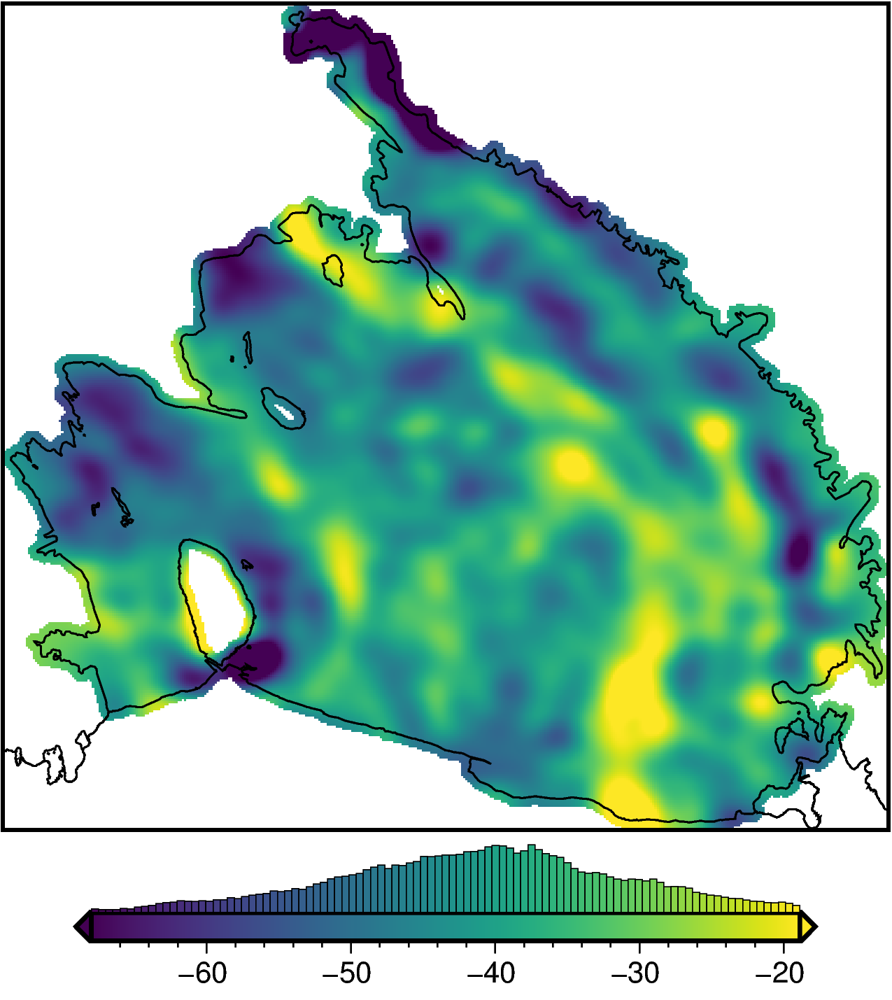

In [29]:
fig = maps.plot_grd(
    masked_grid.Gobs,
    fig_height=10,
    coast=True,
    coast_version="measures-v2",
    # cmap="balance+h0",
    cmap="viridis",
    hist=True,
    robust=True,
    cbar_yoffset=1,
)

fig.show()

In [30]:
masked_df.to_csv(
    "../../data/rosetta_eq_source_1k_levelled.csv.gz",
    sep=",",
    na_rep="",
    header=True,
    index=False,
    encoding="utf-8",
    compression="gzip",
)

In [31]:
grav_df_levelled = pd.read_csv(
    "../../data/rosetta_eq_source_1k_levelled.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)
grav_df_levelled.describe()

,northing,easting,upward,Gobs
count,8.603700e+04,86037.000000,86037.0,86037.000000
mean,-9.807459e+05,-69100.212699,1000.0,-41.635403
std,1.971350e+05,241608.797229,0.0,12.634020
min,-1.365000e+06,-602500.000000,1000.0,-222.110615
25%,-1.137500e+06,-250000.000000,1000.0,-48.028661
50%,-9.925000e+05,-62500.000000,1000.0,-40.825133
75%,-8.425000e+05,125000.000000,1000.0,-34.336530
max,-4.250000e+05,405000.000000,1000.0,1.997854


Warning 1: The definition of geographic CRS EPSG:4326 got from GeoTIFF keys is not the same as the one from the EPSG registry, which may cause issues during reprojection operations. Set GTIFF_SRS_SOURCE configuration option to EPSG to use official parameters (overriding the ones from GeoTIFF keys), or to GEOKEYS to use custom values from GeoTIFF keys and drop the EPSG code.
Warning 1: The definition of geographic CRS EPSG:4326 got from GeoTIFF keys is not the same as the one from the EPSG registry, which may cause issues during reprojection operations. Set GTIFF_SRS_SOURCE configuration option to EPSG to use official parameters (overriding the ones from GeoTIFF keys), or to GEOKEYS to use custom values from GeoTIFF keys and drop the EPSG code.
Warning 1: The definition of geographic CRS EPSG:4326 got from GeoTIFF keys is not the same as the one from the EPSG registry, which may cause issues during reprojection operations. Set GTIFF_SRS_SOURCE configuration option to EPSG to use officia

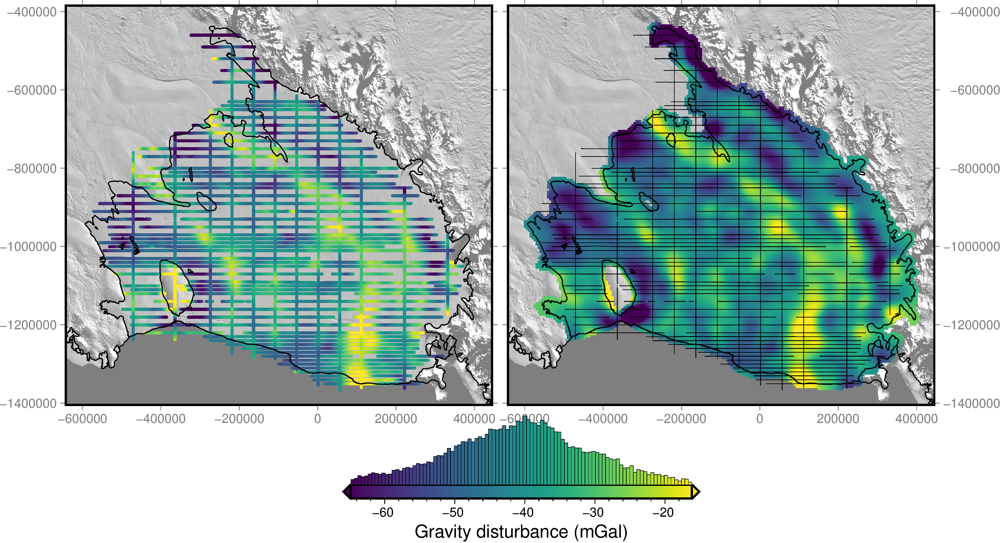

In [32]:
# set region
region = vd.pad_region(
    vd.get_region((grav_df_levelled.easting, grav_df_levelled.northing)), 40e3
)

grav_grid_levelled = (
    grav_df_levelled[grav_df_levelled.test == False]
    .set_index(["northing", "easting"])
    .to_xarray()
    .Gobs
)

fig = maps.plot_grd(
    fetch.modis_moa(),
    image=True,
    cmap="gray",
    region=region,
    fig_height=10,
    frame=["nESw", "xa", "ya"],
    transparency=50,
)
lims = utils.get_min_max(
    rosetta_levelled.disturbance,
    robust=True,
)
# lims = [-30,30]
pygmt.makecpt(
    # cmap="balance+h0",
    cmap="viridis",
    continuous=True,
    series=lims,
    background="o",
    output="../../plotting/RIS_grav.cpt",
)

fig = maps.plot_grd(
    grav_grid_levelled,
    region=region,
    coast=True,
    # cmap="balance+h0",
    cmap="../../plotting/RIS_grav.cpt",
    cbar_label="Gravity disturbance (mGal)",
    hist=True,
    cpt_lims=lims,
    cbar_xoffset=-5,
    fig_height=10,
    fig=fig,
    origin_shift="no_shift",
)


# plot point gravity data
fig.plot(
    x=rosetta_levelled.easting,
    y=rosetta_levelled.northing,
    style="p",
)
# plot a basemap
fig = maps.plot_grd(
    fetch.modis_moa(),
    image=True,
    cmap="gray",
    region=region,
    fig_height=10,
    frame=["neSW", "xa", "ya"],
    fig=fig,
    origin_shift="xshift",
    xshift_amount=-1,
    transparency=50,
)

# plot point gravity data
fig.plot(
    x=rosetta_levelled.easting,
    y=rosetta_levelled.northing,
    color=rosetta_levelled.disturbance,
    style="c2p",
    # cmap=True,
    cmap="../../plotting/RIS_grav.cpt",
)

maps.add_coast(
    fig,
)

fig.show()

# Repeat with first removing outliers

In [12]:
rosetta_UC = pd.read_csv(
    "../../data/ROSETTA_UC.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)
rosetta_UC.dropna(subset="FAG_levelled", inplace=True)
rosetta_UC.describe()

,easting,northing,line,LATITUDE,LONGITUDE,unixtime,Height,FAG_levelled,dist_along_line,mistie_before_UC,intersecting_line,up_cont_grav,dif,mistie_after_UC
count,38106.000000,3.810600e+04,38106.000000,37243.000000,37243.000000,3.724300e+04,38106.000000,38106.000000,38106.000000,1704.000000,852.000000,38106.000000,38106.000000,852.000000
mean,-86452.716611,-1.000882e+06,666.940141,-80.569377,-37.553185,1.457282e+09,793.380839,0.178232,330776.624441,0.284638,815.623239,0.201990,0.023758,0.195705
std,212319.269750,1.978192e+05,266.106586,1.782562,164.975209,1.419616e+07,84.595750,13.828917,220867.316758,5.206815,286.885417,13.190412,1.425300,4.856286
min,-571286.658609,-1.367282e+06,20.000000,-85.387441,-179.978599,1.447367e+09,650.085400,-285.495212,228.712147,-39.323652,50.000000,-227.512365,-20.999761,-31.132140
25%,-241920.367902,-1.160507e+06,470.000000,-81.858765,-169.879744,1.448316e+09,744.647838,-7.261404,143461.769673,-1.794086,570.000000,-7.076050,-0.366643,-1.738407
50%,-80109.153154,-1.010449e+06,650.000000,-80.379084,-158.354158,1.449134e+09,774.987318,0.247913,303380.605696,0.201308,955.000000,0.205302,0.000686,0.035426
75%,75505.628018,-8.504463e+05,850.000000,-79.151582,171.015026,1.479948e+09,820.050591,7.950586,492611.668244,1.797093,1070.000000,7.790776,0.353437,1.910585
max,371296.853790,-4.604545e+05,1140.000000,-77.344218,179.979597,1.480734e+09,1376.838556,75.203892,908258.425261,40.569202,1140.000000,65.843562,75.200788,39.348110


## remove outliers

Length of original data: 38106
Length of cleaned data: 37764


<Axes: >

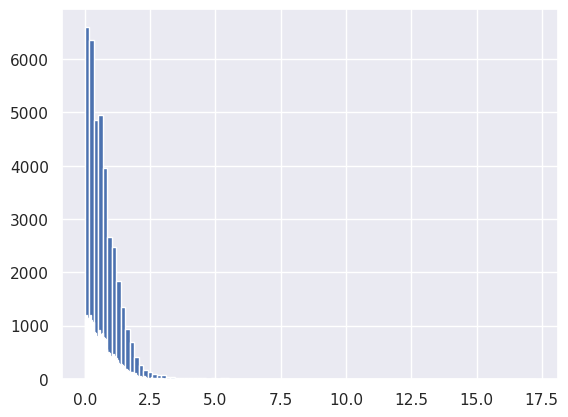

In [13]:
rosetta_UC["zscore"] = np.abs(stats.zscore(rosetta_UC.up_cont_grav))
rosetta_UC.sort_values(by="zscore", ascending=False, inplace=True)
rosetta_UC.zscore.hist(bins=100)

# dropped base on z-score
df_cleaned = rosetta_UC[rosetta_UC.zscore < 3].copy()
df_outliers = rosetta_UC[rosetta_UC.zscore >= 3].copy()

print("Length of original data:", len(rosetta_UC))
print("Length of cleaned data:", len(df_cleaned))

df_cleaned.zscore.hist(bins=100)

In [14]:
df_cleaned.describe()

,easting,northing,line,LATITUDE,LONGITUDE,unixtime,Height,FAG_levelled,dist_along_line,mistie_before_UC,intersecting_line,up_cont_grav,dif,mistie_after_UC,zscore
count,37764.000000,3.776400e+04,37764.000000,36908.000000,36908.000000,3.690800e+04,37764.000000,37764.000000,37764.000000,1696.000000,848.000000,37764.000000,37764.000000,848.000000,37764.000000
mean,-85400.520583,-1.002386e+06,668.840721,-80.556630,-36.899157,1.457193e+09,792.262277,0.441192,332231.546831,0.169587,814.989387,0.446640,0.005448,0.081608,0.667407
std,212184.613783,1.957472e+05,263.894722,1.763942,165.197216,1.414757e+07,82.795326,11.628830,220466.506726,4.870670,287.173849,11.249334,0.914507,4.504858,0.531280
min,-571286.658609,-1.367282e+06,20.000000,-85.387441,-179.978599,1.447367e+09,650.085400,-49.066601,228.712147,-39.323652,50.000000,-39.318698,-12.759754,-31.132140,0.000040
25%,-239325.061391,-1.160508e+06,470.000000,-81.837372,-169.966223,1.448316e+09,744.448629,-7.162919,145505.732832,-1.799649,570.000000,-6.980712,-0.365907,-1.745752,0.244361
50%,-77516.708260,-1.010453e+06,650.000000,-80.377141,-158.320659,1.449134e+09,774.596062,0.279251,304675.166416,0.176075,910.000000,0.240532,-0.001326,0.028438,0.555899
75%,76335.715985,-8.504515e+05,850.000000,-79.149656,171.099147,1.479947e+09,818.931748,7.900701,494263.811127,1.764063,1070.000000,7.751647,0.346499,1.846049,0.961299
max,371296.853790,-4.604545e+05,1140.000000,-77.344218,179.979597,1.480734e+09,1376.838556,46.177935,908258.425261,40.569202,1140.000000,39.734492,15.853382,39.348110,2.997103


Plot outliers and cleaned gravity data

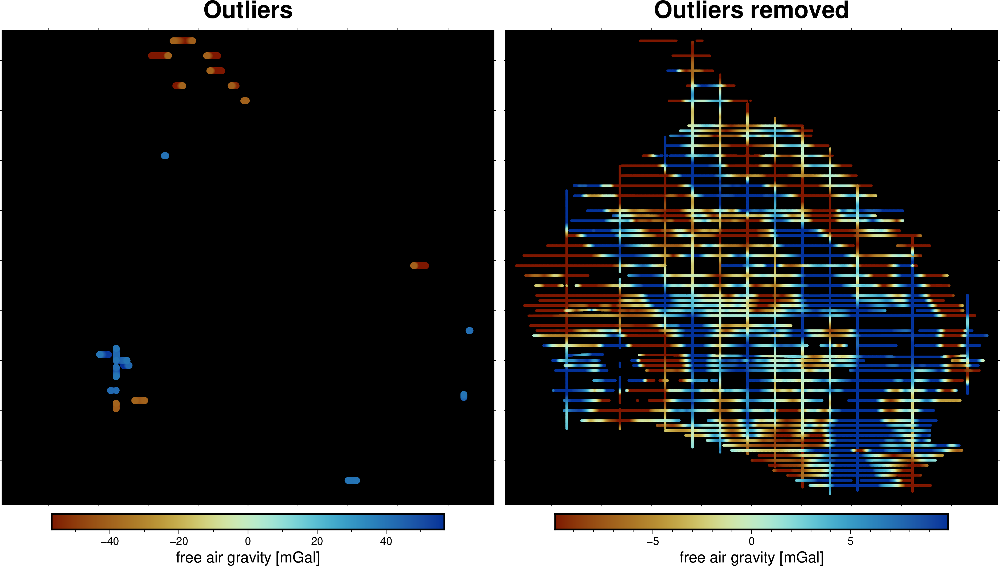

In [25]:
# plot a basemap
region = vd.pad_region(vd.get_region((rosetta_UC.easting, rosetta_UC.northing)), 20e3)
fig = maps.basemap(
    region,
    title="Outliers",
    background="black",
)

# get a quarter of max absolute value and make a colorscale
maxabs = vd.maxabs(df_outliers.up_cont_grav) * 0.25
pygmt.makecpt(cmap="roma", series=[-maxabs, maxabs])

# plot gravity data
fig.plot(
    x=df_outliers.easting,
    y=df_outliers.northing,
    color=df_outliers.up_cont_grav,
    style="c6p",
    cmap=True,
)

# plot the colorbar
fig.colorbar(frame='af+l"free air gravity [mGal]"')


# add a second figure to the right
fig = maps.basemap(
    region,
    title="Outliers removed",
    origin_shift="xshift",
    fig=fig,
    background="black",
)

# get a quarter of max absolute value and make a colorscale
maxabs = vd.maxabs(df_cleaned.up_cont_grav) * 0.25
pygmt.makecpt(cmap="roma", series=[-maxabs, maxabs])

# plot gravity data
fig.plot(
    x=df_cleaned.easting,
    y=df_cleaned.northing,
    color=df_cleaned.up_cont_grav,
    style="c2p",
    cmap=True,
)

# plot the colorbar
fig.colorbar(frame='af+l"free air gravity [mGal]"')

fig.show()

## create equivalent sources

In [26]:
eqs = hm.EquivalentSources(damping=10e3, depth=10e3, block_size=2e3)

coords = (
    df_cleaned.easting,
    df_cleaned.northing,
    np.ones_like(df_cleaned.northing) * 1e3,
)
data = df_cleaned.up_cont_grav

eqs.fit(coords, data)

EquivalentSources(block_size=2000.0, damping=10000.0, depth=10000.0)

In [30]:
# Define grid coordinates
# region = vd.pad_region(vd.get_region(coords), 25e3)
region = regions.ross_ice_shelf
grid_coords = vd.grid_coordinates(
    region=region,
    spacing=5e3,
    pixel_register=False,
    extra_coords=1e3,  # upward continue to 1km
)

# grid the coordinates
observations = vd.make_xarray_grid(
    (grid_coords[0], grid_coords[1]),
    data=grid_coords[2],
    data_names="upward",
    dims=("northing", "easting"),
).upward


grav_df = vd.grid_to_table(observations)

# resample to half spacing to make training / testing points
grav_df = inv_utils.resample_with_test_points(5e3, grav_df, region)

grav_df["Gobs"] = eqs.predict((grav_df.easting, grav_df.northing, grav_df.upward))

grid = grav_df.set_index(["northing", "easting"]).to_xarray()

grav_df["masked"] = vd.distance_mask(
    (df_cleaned.easting, df_cleaned.northing),
    maxdist=30e3,
    coordinates=(grav_df.easting, grav_df.northing),
)

grav_df = grav_df[grav_df.masked].drop(columns="masked")
grav_df

,northing,easting,test,upward,Gobs
4901,-1395000.0,47500.0,True,1000.0,3.554728
4902,-1395000.0,50000.0,False,1000.0,3.782999
4903,-1395000.0,52500.0,True,1000.0,4.021368
4904,-1395000.0,55000.0,False,1000.0,4.269912
4905,-1395000.0,57500.0,True,1000.0,4.528242
...,...,...,...,...,...
182287,-432500.0,-200000.0,True,1000.0,-13.966332
182288,-432500.0,-197500.0,True,1000.0,-13.785987
182289,-432500.0,-195000.0,True,1000.0,-13.578367
182290,-432500.0,-192500.0,True,1000.0,-13.347544


# Results

In [31]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()
grav_grid

<xarray.Dataset>
Dimensions:   (northing: 386, easting: 401)
Coordinates:
  * northing  (northing) float64 -1.395e+06 -1.392e+06 ... -4.35e+05 -4.325e+05
  * easting   (easting) float64 -6e+05 -5.975e+05 -5.95e+05 ... 3.975e+05 4e+05
Data variables:
    test      (northing, easting) object nan nan nan nan nan ... nan nan nan nan
    upward    (northing, easting) float64 nan nan nan nan ... nan nan nan nan
    Gobs      (northing, easting) float64 nan nan nan nan ... nan nan nan nan

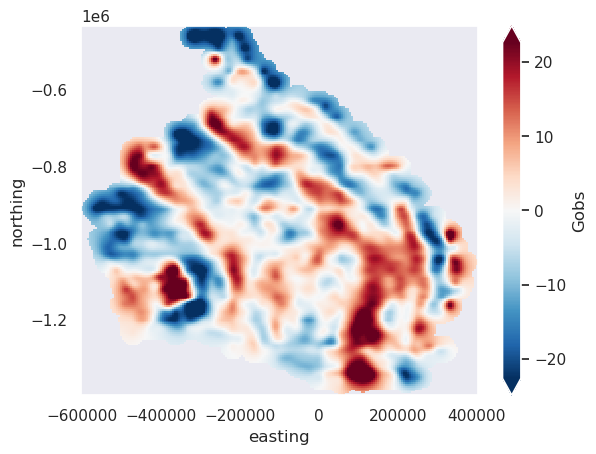

In [32]:
grav_df[grav_df.test == False].set_index(["northing", "easting"]).to_xarray().Gobs.plot(
    robust=True
)

In [33]:
grav_df.to_csv(
    "../../data/rosetta_eq_source_1k_up_continued.csv.gz",
    sep=",",
    na_rep="",
    header=True,
    index=False,
    encoding="utf-8",
    compression="gzip",
)

In [15]:
grav_df = pd.read_csv(
    "../../data/rosetta_eq_source_1k_up_continued.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)
grav_df.describe()

,northing,easting,upward,Gobs
count,9.571900e+04,95719.000000,95719.0,95719.000000
mean,-9.762107e+05,-97781.971186,1000.0,-0.370875
std,2.176096e+05,237968.057922,0.0,10.695175
min,-1.395000e+06,-600000.000000,1000.0,-35.006585
25%,-1.150000e+06,-280000.000000,1000.0,-7.416881
50%,-9.900000e+05,-102500.000000,1000.0,-0.297917
75%,-8.200000e+05,92500.000000,1000.0,6.444853
max,-4.325000e+05,400000.000000,1000.0,34.301253


In [16]:
df_cleaned.describe()

,easting,northing,line,LATITUDE,LONGITUDE,unixtime,Height,FAG_levelled,dist_along_line,mistie_before_UC,intersecting_line,up_cont_grav,dif,mistie_after_UC,zscore
count,37764.000000,3.776400e+04,37764.000000,36908.000000,36908.000000,3.690800e+04,37764.000000,37764.000000,37764.000000,1696.000000,848.000000,37764.000000,37764.000000,848.000000,37764.000000
mean,-85400.520583,-1.002386e+06,668.840721,-80.556630,-36.899157,1.457193e+09,792.262277,0.441192,332231.546831,0.169587,814.989387,0.446640,0.005448,0.081608,0.667407
std,212184.613783,1.957472e+05,263.894722,1.763942,165.197216,1.414757e+07,82.795326,11.628830,220466.506726,4.870670,287.173849,11.249334,0.914507,4.504858,0.531280
min,-571286.658609,-1.367282e+06,20.000000,-85.387441,-179.978599,1.447367e+09,650.085400,-49.066601,228.712147,-39.323652,50.000000,-39.318698,-12.759754,-31.132140,0.000040
25%,-239325.061391,-1.160508e+06,470.000000,-81.837372,-169.966223,1.448316e+09,744.448629,-7.162919,145505.732832,-1.799649,570.000000,-6.980712,-0.365907,-1.745752,0.244361
50%,-77516.708260,-1.010453e+06,650.000000,-80.377141,-158.320659,1.449134e+09,774.596062,0.279251,304675.166416,0.176075,910.000000,0.240532,-0.001326,0.028438,0.555899
75%,76335.715985,-8.504515e+05,850.000000,-79.149656,171.099147,1.479947e+09,818.931748,7.900701,494263.811127,1.764063,1070.000000,7.751647,0.346499,1.846049,0.961299
max,371296.853790,-4.604545e+05,1140.000000,-77.344218,179.979597,1.480734e+09,1376.838556,46.177935,908258.425261,40.569202,1140.000000,39.734492,15.853382,39.348110,2.997103


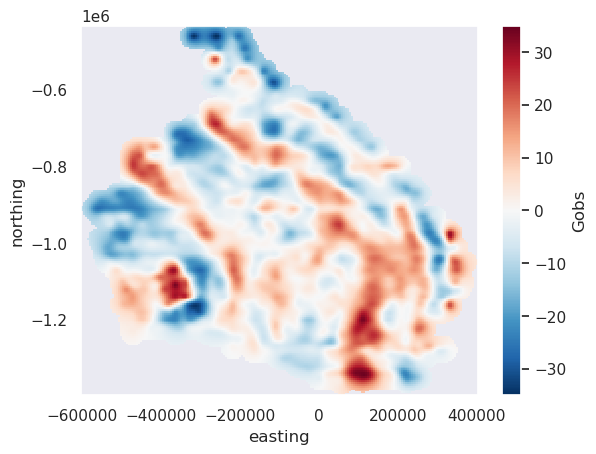

In [17]:
grav_grid = (
    grav_df[grav_df.test == False].set_index(["northing", "easting"]).to_xarray().Gobs
)
grav_grid.plot()

Warning 1: The definition of geographic CRS EPSG:4326 got from GeoTIFF keys is not the same as the one from the EPSG registry, which may cause issues during reprojection operations. Set GTIFF_SRS_SOURCE configuration option to EPSG to use official parameters (overriding the ones from GeoTIFF keys), or to GEOKEYS to use custom values from GeoTIFF keys and drop the EPSG code.
Warning 1: The definition of geographic CRS EPSG:4326 got from GeoTIFF keys is not the same as the one from the EPSG registry, which may cause issues during reprojection operations. Set GTIFF_SRS_SOURCE configuration option to EPSG to use official parameters (overriding the ones from GeoTIFF keys), or to GEOKEYS to use custom values from GeoTIFF keys and drop the EPSG code.
Warning 1: The definition of geographic CRS EPSG:4326 got from GeoTIFF keys is not the same as the one from the EPSG registry, which may cause issues during reprojection operations. Set GTIFF_SRS_SOURCE configuration option to EPSG to use officia

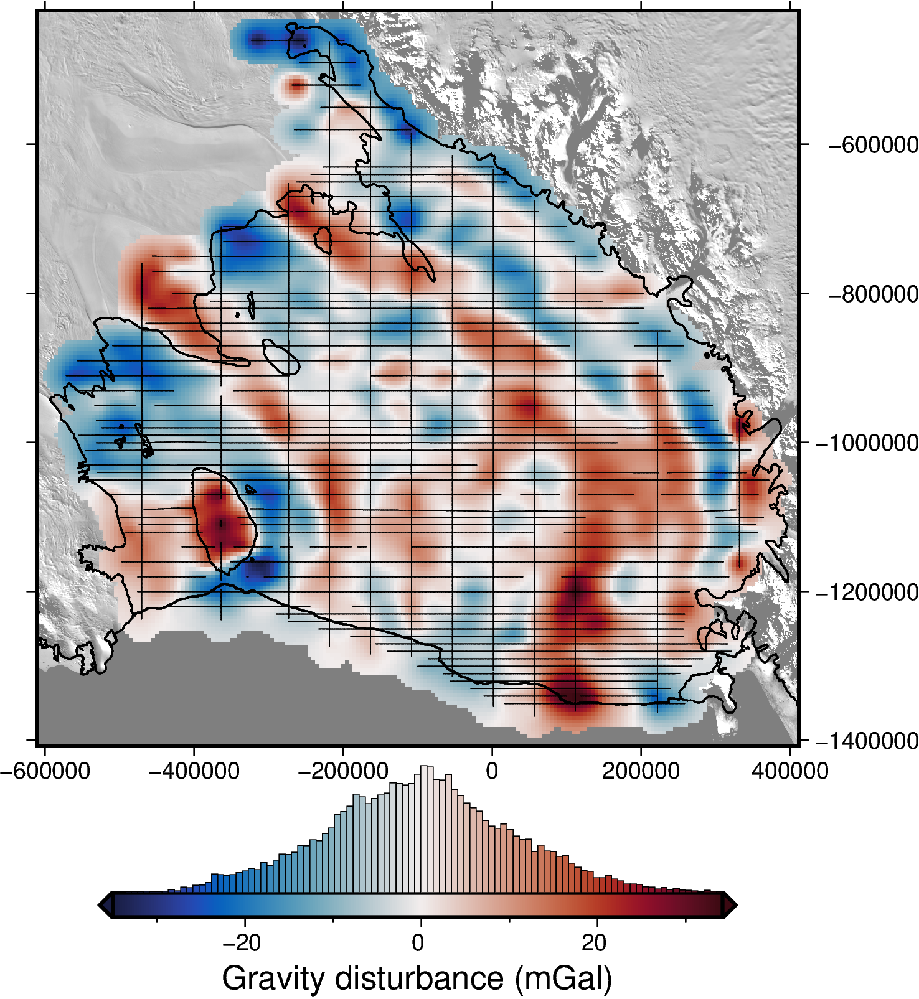

In [41]:
# set region
region = vd.pad_region(vd.get_region((df_cleaned.easting, df_cleaned.northing)), 40e3)

grav_grid = (
    grav_df[grav_df.test == False].set_index(["northing", "easting"]).to_xarray().Gobs
)

fig = maps.plot_grd(
    fetch.modis_moa(),
    image=True,
    cmap="gray",
    region=region,
    fig_height=10,
    transparency=50,
)

fig = maps.plot_grd(
    grav_grid,
    region=region,
    coast=True,
    cmap="balance+h0",
    cbar_label="Gravity disturbance (mGal)",
    hist=True,
    # cbar_xoffset=-5,
    fig_height=10,
    frame=["nESw", "xa", "ya"],
    fig=fig,
    origin_shift="no_shift",
)

# plot point gravity data
fig.plot(
    x=df_cleaned.easting,
    y=df_cleaned.northing,
    style="p",
)

fig.show()

Warning 1: The definition of geographic CRS EPSG:4326 got from GeoTIFF keys is not the same as the one from the EPSG registry, which may cause issues during reprojection operations. Set GTIFF_SRS_SOURCE configuration option to EPSG to use official parameters (overriding the ones from GeoTIFF keys), or to GEOKEYS to use custom values from GeoTIFF keys and drop the EPSG code.
Warning 1: The definition of geographic CRS EPSG:4326 got from GeoTIFF keys is not the same as the one from the EPSG registry, which may cause issues during reprojection operations. Set GTIFF_SRS_SOURCE configuration option to EPSG to use official parameters (overriding the ones from GeoTIFF keys), or to GEOKEYS to use custom values from GeoTIFF keys and drop the EPSG code.
Warning 1: The definition of geographic CRS EPSG:4326 got from GeoTIFF keys is not the same as the one from the EPSG registry, which may cause issues during reprojection operations. Set GTIFF_SRS_SOURCE configuration option to EPSG to use officia

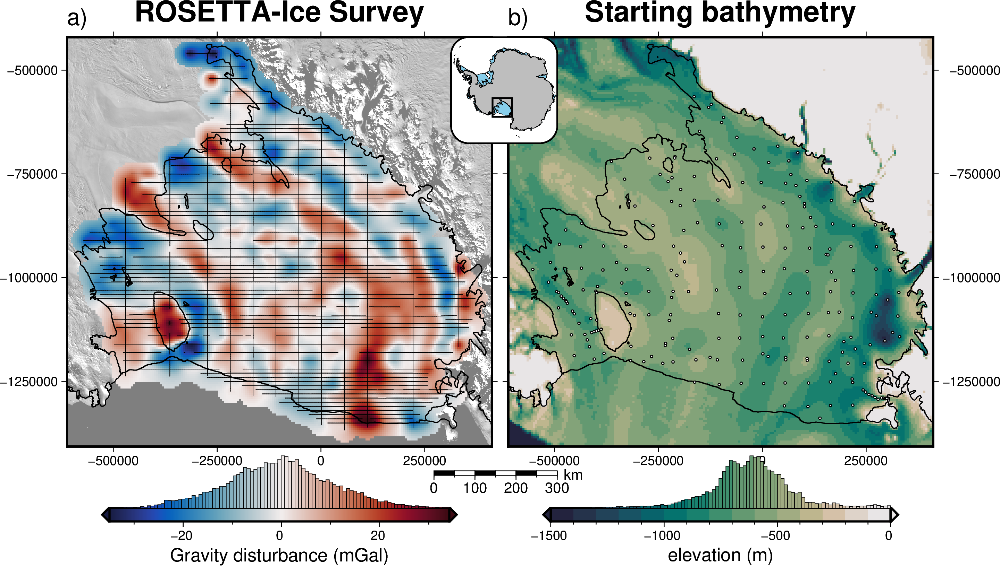

In [18]:
# set region
region = vd.pad_region(vd.get_region((df_cleaned.easting, df_cleaned.northing)), 40e3)

grav_grid = (
    grav_df[grav_df.test == False].set_index(["northing", "easting"]).to_xarray().Gobs
)

fig = maps.plot_grd(
    fetch.modis_moa(),
    image=True,
    cmap="gray",
    region=region,
    fig_height=10,
    transparency=50,
)

fig = maps.plot_grd(
    grav_grid,
    region=region,
    title="ROSETTA-Ice Survey",
    coast=True,
    cmap="balance+h0",
    cbar_label="Gravity disturbance (mGal)",
    hist=True,
    cbar_yoffset=1.5,
    fig_height=10,
    frame=["neSW", "xa250000", "ya250000"],
    fig=fig,
    origin_shift="no_shift",
)

# plot point gravity data
fig.plot(
    x=df_cleaned.easting,
    y=df_cleaned.northing,
    style="p",
)

width = utils.get_fig_width(fig)

fig.text(
    position="TL",
    justify="BL",
    text="a)",
    font="16p,Helvetica,black",
    offset="j0/.3",
    no_clip=True,
)

# plot starting bed
bed_from_constraints = xr.open_zarr(
    f"../../inversion_layers/bed_from_constraints_5k_verde_spline.zarr",
).bed
constraints = pd.read_csv(
    "../../data/bed_constraints_5k.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)

pygmt.grd2cpt(
    grid=bed_from_constraints,
    cmap="rain",
    reverse=True,
    limit="-1500/0",
    nlevels=16,
    output="../../plotting/RIS_bathy.cpt",
)
fig = maps.plot_grd(
    bed_from_constraints,
    region=region,
    title="Starting bathymetry",
    fig_height=10,
    coast=True,
    cmap="../../plotting/RIS_bathy.cpt",
    cpt_lims=[-1500, 0],
    cbar_label="elevation (m)",
    hist=True,
    cbar_yoffset=1.5,
    frame=["nESw", "xa250000", "ya250000"],
    fig=fig,
    origin_shift="xshift",
)
fig.plot(
    x=constraints[constraints.inside].easting,
    y=constraints[constraints.inside].northing,
    style="c.06c",
    fill="white",
    pen=".5p,black",
)

maps.add_inset(
    fig,
    region=region,
    inset_pos="TL",
    inset_width=0.25,
    inset_offset=f"-{((width+.8)*.25)/2}c/0c",
    inset_box="+gwhite+p1p+r12p",
)

fig.text(
    position="TL",
    justify="BL",
    text="b)",
    font="16p,Helvetica,black",
    offset="j0/.3",
    no_clip=True,
)
info = utils.set_proj(
    region,
    fig_height=10,
)
maps.add_scalebar(fig, region, info[1], position="n-.03/-.07")

fig.show()

Warning 1: The definition of geographic CRS EPSG:4326 got from GeoTIFF keys is not the same as the one from the EPSG registry, which may cause issues during reprojection operations. Set GTIFF_SRS_SOURCE configuration option to EPSG to use official parameters (overriding the ones from GeoTIFF keys), or to GEOKEYS to use custom values from GeoTIFF keys and drop the EPSG code.
Warning 1: The definition of geographic CRS EPSG:4326 got from GeoTIFF keys is not the same as the one from the EPSG registry, which may cause issues during reprojection operations. Set GTIFF_SRS_SOURCE configuration option to EPSG to use official parameters (overriding the ones from GeoTIFF keys), or to GEOKEYS to use custom values from GeoTIFF keys and drop the EPSG code.
Warning 1: The definition of geographic CRS EPSG:4326 got from GeoTIFF keys is not the same as the one from the EPSG registry, which may cause issues during reprojection operations. Set GTIFF_SRS_SOURCE configuration option to EPSG to use officia

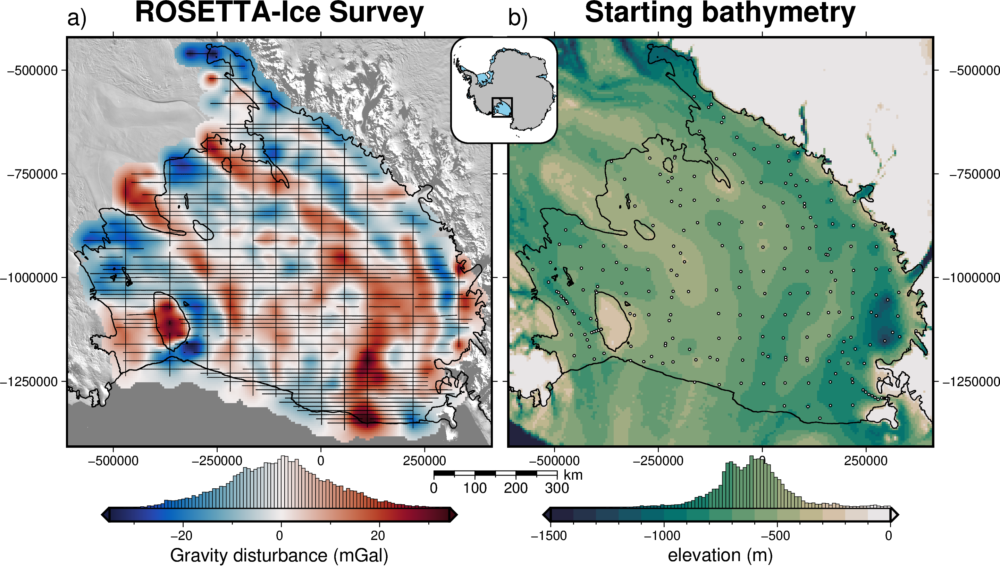

In [19]:
# set region
region = vd.pad_region(vd.get_region((df_cleaned.easting, df_cleaned.northing)), 40e3)

grav_grid = (
    grav_df[grav_df.test == False].set_index(["northing", "easting"]).to_xarray().Gobs
)

fig = maps.plot_grd(
    fetch.modis_moa(),
    image=True,
    cmap="gray",
    region=region,
    fig_height=10,
    transparency=50,
)

fig = maps.plot_grd(
    grav_grid,
    region=region,
    title="ROSETTA-Ice Survey",
    coast=True,
    cmap="balance+h0",
    cbar_label="Gravity disturbance (mGal)",
    hist=True,
    cbar_yoffset=1.5,
    fig_height=10,
    frame=["neSW", "xa250000", "ya250000"],
    fig=fig,
    origin_shift="no_shift",
)

# plot point gravity data
fig.plot(
    x=df_cleaned.easting,
    y=df_cleaned.northing,
    style="p",
)

width = utils.get_fig_width(fig)

fig.text(
    position="TL",
    justify="BL",
    text="a)",
    font="16p,Helvetica,black",
    offset="j0/.3",
    no_clip=True,
)

# plot starting bed
bed_from_constraints = xr.open_zarr(
    "../../inversion_layers/bed_from_constraints_5k_gmt_surface.zarr",
).bed
constraints = pd.read_csv(
    "../../data/bed_constraints_5k.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)

pygmt.grd2cpt(
    grid=bed_from_constraints,
    cmap="rain",
    reverse=True,
    limit="-1500/0",
    nlevels=16,
    output="../../plotting/RIS_bathy.cpt",
)
fig = maps.plot_grd(
    bed_from_constraints,
    region=region,
    title="Starting bathymetry",
    fig_height=10,
    coast=True,
    cmap="../../plotting/RIS_bathy.cpt",
    cpt_lims=[-1500, 0],
    cbar_label="elevation (m)",
    hist=True,
    cbar_yoffset=1.5,
    frame=["nESw", "xa250000", "ya250000"],
    fig=fig,
    origin_shift="xshift",
)
fig.plot(
    x=constraints[constraints.inside].easting,
    y=constraints[constraints.inside].northing,
    style="c.06c",
    fill="white",
    pen=".5p,black",
)

maps.add_inset(
    fig,
    region=region,
    inset_pos="TL",
    inset_width=0.25,
    inset_offset=f"-{((width+.8)*.25)/2}c/0c",
    inset_box="+gwhite+p1p+r12p",
)

fig.text(
    position="TL",
    justify="BL",
    text="b)",
    font="16p,Helvetica,black",
    offset="j0/.3",
    no_clip=True,
)
info = utils.set_proj(
    region,
    fig_height=10,
)
maps.add_scalebar(fig, region, info[1], position="n-.03/-.07")

fig.show()

Warning 1: The definition of geographic CRS EPSG:4326 got from GeoTIFF keys is not the same as the one from the EPSG registry, which may cause issues during reprojection operations. Set GTIFF_SRS_SOURCE configuration option to EPSG to use official parameters (overriding the ones from GeoTIFF keys), or to GEOKEYS to use custom values from GeoTIFF keys and drop the EPSG code.
Warning 1: The definition of geographic CRS EPSG:4326 got from GeoTIFF keys is not the same as the one from the EPSG registry, which may cause issues during reprojection operations. Set GTIFF_SRS_SOURCE configuration option to EPSG to use official parameters (overriding the ones from GeoTIFF keys), or to GEOKEYS to use custom values from GeoTIFF keys and drop the EPSG code.
Warning 1: The definition of geographic CRS EPSG:4326 got from GeoTIFF keys is not the same as the one from the EPSG registry, which may cause issues during reprojection operations. Set GTIFF_SRS_SOURCE configuration option to EPSG to use officia

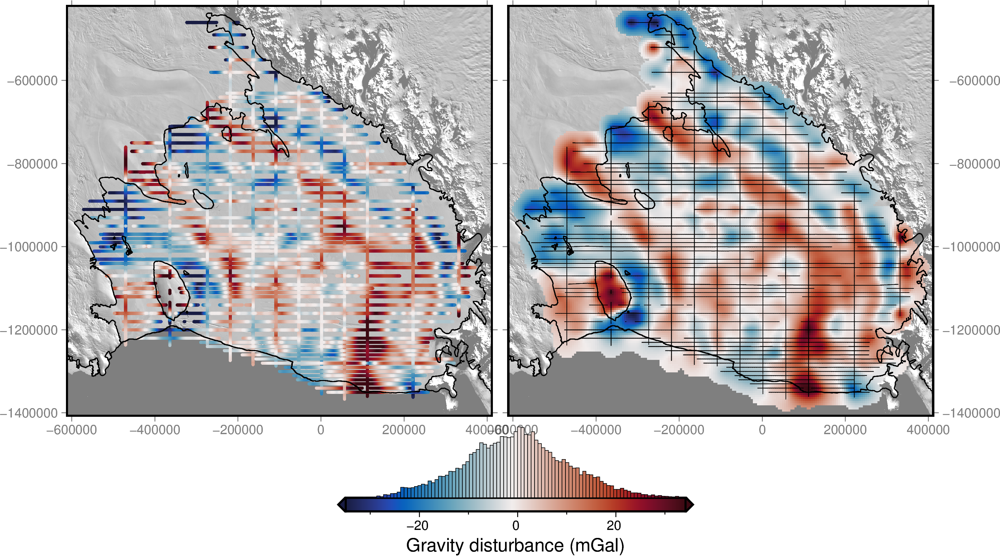

In [38]:
# set region
region = vd.pad_region(vd.get_region((df_cleaned.easting, df_cleaned.northing)), 40e3)

grav_grid = (
    grav_df[grav_df.test == False].set_index(["northing", "easting"]).to_xarray().Gobs
)

fig = maps.plot_grd(
    fetch.modis_moa(),
    image=True,
    cmap="gray",
    region=region,
    fig_height=10,
    frame=["nESw", "xa", "ya"],
    transparency=50,
)

# pygmt.grd2cpt(
#     grid=grav_grid,
#     cmap="balance+h0",
#     continuous=True,
#     output="../plotting/RIS_grav.cpt",
# )
pygmt.makecpt(
    cmap="balance+h0",
    continuous=True,
    series=utils.get_min_max(
        df_cleaned.up_cont_grav,
        robust=True,
    ),
    background="o",
    output="../../plotting/RIS_grav.cpt",
)

fig = maps.plot_grd(
    grav_grid,
    region=region,
    coast=True,
    # cmap="balance+h0",
    cmap="../../plotting/RIS_grav.cpt",
    cbar_label="Gravity disturbance (mGal)",
    hist=True,
    cbar_xoffset=-5,
    fig_height=10,
    fig=fig,
    origin_shift="no_shift",
)


# plot point gravity data
fig.plot(
    x=df_cleaned.easting,
    y=df_cleaned.northing,
    # color=df_cleaned.up_cont_grav,
    style="p",
    # cmap=True,
    # cmap="../plotting/RIS_grav.cpt",
)
# plot a basemap
fig = maps.plot_grd(
    fetch.modis_moa(),
    image=True,
    cmap="gray",
    region=region,
    fig_height=10,
    frame=["neSW", "xa", "ya"],
    fig=fig,
    origin_shift="xshift",
    xshift_amount=-1,
    transparency=50,
)

# plot point gravity data
fig.plot(
    x=df_cleaned.easting,
    y=df_cleaned.northing,
    color=df_cleaned.up_cont_grav,
    style="c2p",
    # cmap=True,
    cmap="../../plotting/RIS_grav.cpt",
)

maps.add_coast(
    fig,
)
# grav.plot_flightlines(
#     fig,
#     df_cleaned[df_cleaned.line<1000],
#     direction="EW",
#     plot_lines=False,
# )
# grav.plot_flightlines(
#     fig,
#     df_cleaned[df_cleaned.line>=1000],
#     direction="NS",
#     plot_lines=False,
# )


fig.show()

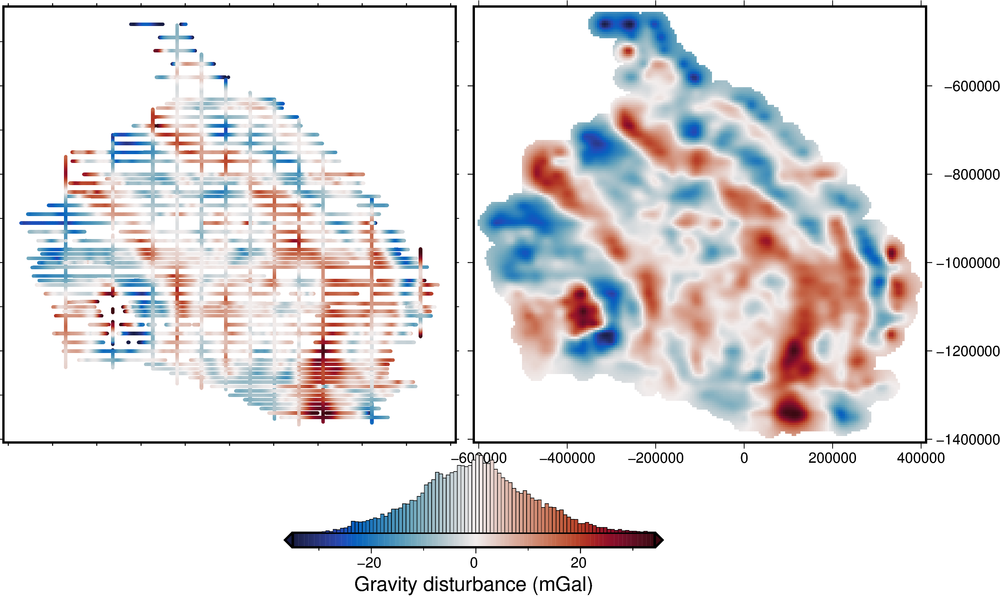

In [13]:
# set region
region = vd.pad_region(vd.get_region((df_cleaned.easting, df_cleaned.northing)), 40e3)


# plot gridded and masked gravity data
grav_grid = (
    grav_df[grav_df.test == False].set_index(["northing", "easting"]).to_xarray().Gobs
)

fig = maps.plot_grd(
    grav_grid,
    fig_width=10,
    region=region,
    cmap="balance+h0",
    cbar_label="Gravity disturbance (mGal)",
    hist=True,
    cbar_xoffset=-5,
    frame=["nESw", "xa", "ya"],
)


# plot a basemap
fig = maps.basemap(
    region=region,
    fig_width=10,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=-1,
    frame=["neSW", "xa", "ya"],
)

# get a quarter of max absolute value and make a colorscale
# maxabs = vd.maxabs(df_cleaned.up_cont_grav) #* 0.25
# pygmt.makecpt(cmap="balance+h0", series=[-maxabs, maxabs])

# plot point gravity data
fig.plot(
    x=df_cleaned.easting,
    y=df_cleaned.northing,
    color=df_cleaned.up_cont_grav,
    style="c2p",
    cmap=True,
    # frame=True,
)

# grav.plot_flightlines(
#     fig,
#     df_cleaned[df_cleaned.line<1000],
#     direction="EW",
#     plot_lines=False,
# )
# grav.plot_flightlines(
#     fig,
#     df_cleaned[df_cleaned.line>=1000],
#     direction="NS",
#     plot_lines=False,
# )


fig.show()

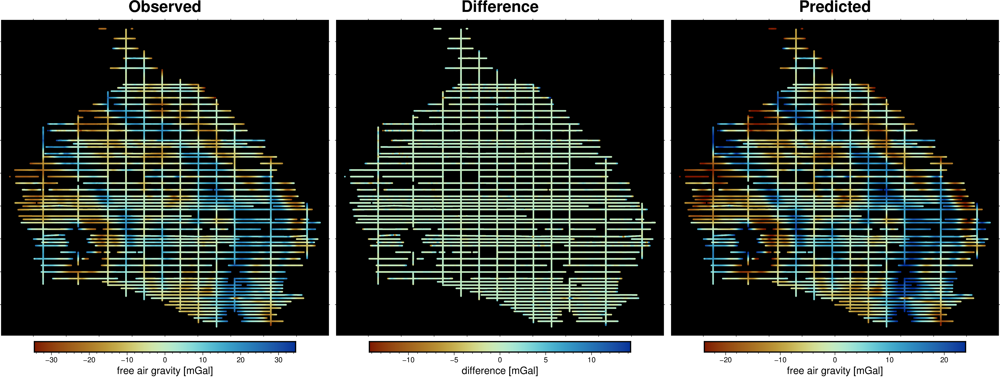

<Axes: >

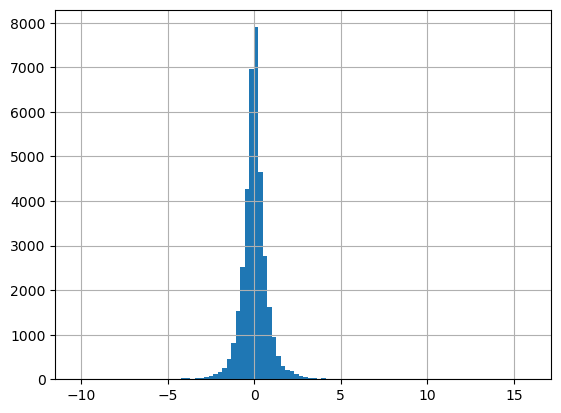

In [32]:
# plot a basemap
fig = maps.basemap(
    region,
    title="Observed",
    background="black",
)

# get a quarter of max absolute value and make a colorscale
maxabs = vd.maxabs(df_cleaned.FAG_levelled) * 0.9
pygmt.makecpt(cmap="roma", series=[-maxabs, maxabs])

# plot gravity data
fig.plot(
    x=df_cleaned.easting,
    y=df_cleaned.northing,
    color=df_cleaned.FAG_levelled,
    style="c2p",
    cmap=True,
)

# plot the colorbar
fig.colorbar(frame='af+l"free air gravity [mGal]"')


# add a second figure to the right
fig = maps.basemap(
    region,
    title="Difference",
    origin_shift="xshift",
    fig=fig,
    background="black",
)

# get a quarter of max absolute value and make a colorscale
dif = df_cleaned.up_cont_grav - df_cleaned.FAG_levelled
maxabs = vd.maxabs(dif) * 0.9
pygmt.makecpt(cmap="roma", series=[-maxabs, maxabs])

# plot gravity data
fig.plot(x=df_cleaned.easting, y=df_cleaned.northing, color=dif, style="c2p", cmap=True)

# plot the colorbar
fig.colorbar(frame='af+l"difference [mGal]"')


# plot a third figure
fig = maps.basemap(
    region,
    title="Predicted",
    origin_shift="xshift",
    fig=fig,
    background="black",
)

# get a quarter of max absolute value and make a colorscale
maxabs = vd.maxabs(df_cleaned.up_cont_grav) * 0.9
pygmt.makecpt(cmap="roma", series=[-maxabs, maxabs])

# plot gravity data
fig.plot(
    x=df_cleaned.easting,
    y=df_cleaned.northing,
    color=df_cleaned.up_cont_grav,
    style="c2p",
    cmap=True,
)

# plot the colorbar
fig.colorbar(frame='af+l"free air gravity [mGal]"')

fig.show()

dif.hist(bins=100)

compare with orginal grid

## compare upward continue amounts

In [14]:
# df_cleaned.elev.hist(bins=100)
# df_cleaned.elev.max()

In [15]:
# # Build the grid coordinates
# # region = vd.get_region(coordinates)

# low = 100
# grid_coords_low = vd.grid_coordinates(region=region, spacing=5e3, extra_coords=low)
# high = 10e3
# grid_coords_high = vd.grid_coordinates(region=region, spacing=5e3, extra_coords=high)

# # Grid the gravity disturbances
# grid_low = eqs_best.grid(grid_coords_low, data_names=["gravity_disturbance"])
# grid_high = eqs_best.grid(grid_coords_high, data_names=["gravity_disturbance"])

# grids = utils.grd_compare(
#     grid_low.gravity_disturbance,
#     grid_high.gravity_disturbance,
#     plot=True,
#     grid1_name=f"Continued to {low}m [mGal]",
#     grid2_name=f"Continued to {high}m [mGal]",
#     cmap="roma",
# )

In [16]:
# up_con_elev = 1e3
# grid_coords = vd.grid_coordinates(region=region, spacing=5e3, extra_coords=up_con_elev)

# # Grid the gravity disturbances
# grid = eqs_best.grid(grid_coords, data_names=["Gobs"])
# grid = grid.reset_coords(names="upward")
# grid.Gobs.plot()
# grid

In [ ]:
# save to a .zarr file
grid.to_zarr(
    "../../data/rosetta_eq_source_1k_up_continued.zarr",
    encoding={
        "Gobs": {"compressor": zarr.Blosc()},
        "upward": {"compressor": zarr.Blosc()},
    },
    mode="w",
)

In [ ]:
rosetta_eq_source_1k_up_continued = xr.open_zarr(
    "../../data/rosetta_eq_source_1k_up_continued.zarr"
)
rosetta_eq_source_1k_up_continued

## mask grid

In [ ]:
up_con_elev = 1e3
grid_coords = vd.grid_coordinates(region=region, spacing=5e3, extra_coords=up_con_elev)

# Grid the gravity disturbances
grid = eqs_best.grid(grid_coords, data_names=["Gobs"])
masked = vd.distance_mask((df_cleaned.x, df_cleaned.y), maxdist=20e3, grid=grid)
masked = masked.reset_coords(names="upward")
masked.Gobs.plot()

## save as .zarr

In [ ]:
# save to a .zarr file

masked.to_zarr(
    "../../data/rosetta_1k_up_continued_20k_masked.zarr",
    encoding={
        "Gobs": {"compressor": zarr.Blosc()},
        "upward": {"compressor": zarr.Blosc()},
    },
    mode="w",
)

# height = pygmt.grdsample(
#     grid=masked.height,
#     region=[-580000, 420000, -1420000, -420000],
#     registration="p",
#     spacing="5000+e",
#     # outgrid="gravity_data/rosetta_eq_source_up_continued_elev.nc",
# ).rename("z")

# gobs = pygmt.grdsample(
#     grid=masked.Gobs,
#     region=[-580000, 420000, -1420000, -420000],
#     registration="p",
#     spacing="5000+e",
#     # outgrid="rosetta_eq_source_up_continued_Gobs.nc",
# ).rename("gobs")

# # merge into a dataset
# output = xr.merge([gobs, height])

# # save to a .zarr file
# output.to_zarr(
#     "../data/rosetta_eq_source_up_continued.zarr",
#     encoding={
#         "gobs": {"compressor": zarr.Blosc()},
#         "z": {"compressor": zarr.Blosc()},
#     },
#     mode="w",
# )

In [ ]:
rosetta_eq_source_up_continued = xr.open_zarr(
    "../../data/rosetta_1k_up_continued_masked.zarr"
)
rosetta_eq_source_up_continued

In [ ]:
fig = maps.subplots(
    [rosetta_eq_source_up_continued.upward, rosetta_eq_source_up_continued.Gobs],
    subplot_titles=["upward continued height", "observed gravity"],
)
fig.show()

## save as .csv

In [19]:
# # convert to a dataframe
# df = vd.grid_to_table(rosetta_eq_source_up_continued)

# # drop rows with nans
# df.dropna(inplace=True)

# # put into correct format for the inversion
# df.rename(
#     columns={"z": "ellipsoidal_elevation", "gobs": "free_air_anomaly"},
#     inplace=True,
# )

# df["lat"] = np.nan
# df["lon"] = np.nan
# df["station_ID"] = np.nan
# df["geoidal_elevation"] = np.nan
# df["elevation_error"] = np.nan
# df["observed_gravity"] = np.nan
# df["observed_gravity_error"] = np.nan
# df["gravity_disturbance"] = np.nan
# df["gravity_disturbance_error"] = np.nan
# df["free_air_anomaly_error"] = np.nan
# df["z_error"] = np.nan

# df = df[
#     [
#         "x",
#         "y",
#         "lat",
#         "lon",
#         "station_ID",
#         "ellipsoidal_elevation",
#         "geoidal_elevation",
#         "elevation_error",
#         "observed_gravity",
#         "observed_gravity_error",
#         "gravity_disturbance",
#         "gravity_disturbance_error",
#         "free_air_anomaly",
#         "free_air_anomaly_error",
#     ]
# ]
# df

In [ ]:
# df.dtypes

In [ ]:
# df = df.astype("float64")
# df.dtypes

In [ ]:
# df.to_csv(
#     "../rosetta_eq_source_up_continued.csv.gz",
#     sep=",",
#     na_rep="",
#     header=True,
#     index=False,
#     encoding="utf-8",
#     compression="gzip",
# )

In [ ]:
# check = pd.read_csv(
#     "../rosetta_eq_source_up_continued.csv.gz",
#     sep=",",
#     header="infer",
#     index_col=None,
#     compression="gzip",
# )
# check

In [ ]:
# df["free_air_anomaly"] -= df.free_air_anomaly.mean()
# df.describe()

In [ ]:
# df.set_index(["y", "x"]).to_xarray().free_air_anomaly.plot()

# Updated AntGG compilation

In [ ]:
# forsberg compilation
# includes AngGG, DTU Space, PolarGap, OIB,a ROSETTA, GOCE
# FA is free-air anom at geioid, DG is disturbance (FA at ellipsoid), BA is bouguer anom (free air at sea)
# antgg_update_tif = rioxarray.open_rasterio('C:/Users/matthewt/Documents/Python_Scripts/RIS_gravity_inversion/gravity_data/ant4d_fa.tif')
# file ='C:/Users/matthewt/Documents/Python_Scripts/RIS_gravity_inversion/gravity_data/ant4d_gravity.dat'
file = "/Volumes/arc_04/tankerma/Datasets/4D_antarctica_grav/ant4d_gravity/ant4d_gravity.dat"
antgg_update = pd.read_csv(
    file,
    delim_whitespace=True,
    skiprows=3,
    names=["id", "lat", "lon", "FA", "Err", "DG", "BA"],
)

transformer = Transformer.from_crs("epsg:4326", "epsg:3031")
antgg_update["x"], antgg_update["y"] = transformer.transform(
    antgg_update.lat.tolist(), antgg_update.lon.tolist()
)

region = vd.get_region((antgg_update.x, antgg_update.y))
antgg_update.describe()

In [ ]:
antgg_update = pygmt.blockmedian(
    antgg_update[["x", "y", "FA"]],
    spacing="5000+e",
    region=(-3330000, 3330000, -3330000, 3330000),
)

# antgg_update = antgg_update.set_index(['x', 'y'])

# antgg_update=antgg_update[~antgg_update.index.duplicated()]
# # # antgg_update.to_xarray()
# xr.Dataset.from_dataframe(antgg_update)

fname = "gravity_data/ant4d_gravity_epsg_5k.nc"
pygmt.surface(
    data=antgg_update[["x", "y", "FA"]],
    spacing=5000,
    region=(-3330000, 3330000, -3330000, 3330000),
    M="2c",
    outgrid=fname,
)
# antgg_update_tif
# pygmt.grdfill(grid=antgg_update_grid, mode='n', L=True, region=fig_reg)#, outgrid=fname)

In [ ]:
start_fig()
fname = "/Volumes/arc_04/tankerma/Datasets/4D_antarctica_grav/ant4d_gravity/ant4d_gravity_epsg_5k.nc"
# make color ramp scaled to points
pygmt.grd2cpt(cmap="jet", continuous=True, region=fig_reg, grid=fname)
# pygmt.makecpt(cmap="viridis", series=[antgg_update.FA.min(), antgg_update.FA.max()])

# plot grid
fig.grdimage(
    grid=fname,
    cmap=True,
    projection=fig_proj,
    region=fig_reg,
    frame=["a", "+gwhite"],
)

fig.colorbar(frame='af+l"observed gravity [mGal]"')

fig.show()

# Ground Surveys

In [ ]:
# from 2019/2020 KIS survey
file = "C:/Users/matthewt/Documents/Python_Scripts/RIS_gravity_inversion/gravity_data/K863_KIS.csv"
KIS = pd.read_csv(file)

transformer = Transformer.from_crs("epsg:4326", "epsg:3031")
KIS["x"], KIS["y"] = transformer.transform(
    KIS.Latitude.tolist(), KIS.Longitude.tolist()
)

KIS

In [ ]:
df = KIS
buffer = 10e3
n = df.y.min() - buffer
s = df.y.max() + buffer
e = df.x.min() - buffer
w = df.x.max() + buffer

df = rosetta_block
df = df[df.y.between(n, s) & df.x.between(e, w)]

KIS["FA_shift"] = KIS.FA + (df.FA.mean() - KIS.FA.mean())

In [ ]:
df = KIS
buffer = 80e3
n = df.y.min() - buffer
s = df.y.max() + buffer
e = df.x.min() - buffer
w = df.x.max() + buffer

start_fig(n=n, s=s, e=e, w=w)


df = KIS
# make color ramp scaled to points
pygmt.makecpt(
    cmap="jet", series=[df.FA_shift.min(), df.FA_shift.max()], background=True
)

# plot points
fig.plot(
    x=df.x,
    y=df.y,
    color=df.FA_shift,
    style="c4p",
    projection=fig_proj,
    region=fig_reg,
    cmap=True,
)

df = rosetta_block

# plot points
fig.plot(
    x=df.x,
    y=df.y,
    color=df.FA,
    style="c4p",
    projection=fig_proj,
    region=fig_reg,
    cmap=True,
)

fig.colorbar(frame='af+l"FA gravity (mGal)"')

fig.show()

In [ ]:
# from 2021/2022 Disco Deep survey
file = "C:/Users/matthewt/Documents/Python_Scripts/RIS_gravity_inversion/gravity_data/K863_DD_2feb22.csv"
DD = pd.read_csv(file)
DD.drop(columns=["Free air anomaly", "Free air effect"], inplace=True)
DD["FA"] = DD["Absolute Gravity"] - DD["Ellipsoidal gravity"] + (DD.Elevation * 0.3086)

transformer = Transformer.from_crs("epsg:4326", "epsg:3031")
DD["x"], DD["y"] = transformer.transform(DD.Latitude.tolist(), DD.Longitude.tolist())
DD

In [ ]:
df = DD
buffer = 10e3
n = df.y.min() - buffer
s = df.y.max() + buffer
e = df.x.min() - buffer
w = df.x.max() + buffer

df = rosetta_block
df = df[df.y.between(n, s) & df.x.between(e, w)]

DD["FA_shift"] = DD.FA + (df.FA.mean() - DD.FA.mean())

start_fig(n=n, s=s, e=e, w=w)


df = DD
# make color ramp scaled to points
pygmt.makecpt(
    cmap="jet", series=[df.FA_shift.min(), df.FA_shift.max()], background=True
)

# plot points
fig.plot(
    x=df.x,
    y=df.y,
    color=df.FA_shift,
    style="c4p",
    projection=fig_proj,
    region=fig_reg,
    cmap=True,
)

df = rosetta_block

# plot points
fig.plot(
    x=df.x,
    y=df.y,
    color=df.FA,
    style="c4p",
    projection=fig_proj,
    region=fig_reg,
    cmap=True,
)

fig.colorbar(frame='af+l"FA gravity (mGal)"')

fig.show()

In [ ]:
# from Atsu Muto
file = "C:/Users/matthewt/Documents/Python_Scripts/RIS_gravity_inversion/gravity_data/wgz_fa.csv"
WGZ = pd.read_csv(file)
WGZ.rename(
    columns={"free-air_disturbance(mGal)": "FA", "PSX(m)": "x", "PSY(m)": "y"},
    inplace=True,
)
# transformer = Transformer.from_crs("epsg:4326", "epsg:3031")
# WGZ['x'], WGZ['y'] = transformer.transform(WGZ.Latitude.tolist(), WGZ.Longitude.tolist())
WGZ

In [ ]:
df = WGZ
buffer = 20e3
n = df.y.min() - buffer
s = df.y.max() + buffer
e = df.x.min() - buffer
w = df.x.max() + buffer

df = rosetta_block
df = df[df.y.between(n, s) & df.x.between(e, w)]

WGZ["FA_shift"] = WGZ.FA + (df.FA.mean() - WGZ.FA.mean())

start_fig(n=n, s=s, e=e, w=w)


df = WGZ
# make color ramp scaled to points
pygmt.makecpt(
    cmap="jet", series=[df.FA_shift.min(), df.FA_shift.max()], background=True
)

# plot points
fig.plot(
    x=df.x,
    y=df.y,
    color=df.FA_shift,
    style="c4p",
    projection=fig_proj,
    region=fig_reg,
    cmap=True,
)

df = rosetta_block

# plot points
fig.plot(
    x=df.x,
    y=df.y,
    color=df.FA,
    style="c4p",
    projection=fig_proj,
    region=fig_reg,
    cmap=True,
)

fig.colorbar(frame='af+l"FA gravity (mGal)"')

fig.show()